In [109]:
# eda.ipynb 
# Imports
import pandas as pd 
import numpy as np

In [110]:
# Read in Files
def readin(file, drop=[]):
    return pd.read_csv(f"data/{file}.csv").drop(columns=drop)
    
ratings = readin("ratings", drop=["timestamp"])
movies  = readin("movies")
tags    = readin("tags", drop=["timestamp","userId"]) 


print(
    f"ratings : {ratings.shape}\n"
    f"movies  : {movies.shape}\n"
    f"tags    : {tags.shape}"
)

ratings : (33832162, 3)
movies  : (86537, 3)
tags    : (2328315, 2)


In [111]:
# Reduce 

# 1) Remove movies that has a few reviews
# a) Makes a boolean mask using count 
# b) Removes all False elements from the mask
# c) Removes all movies not in mask
mask = ratings.groupby("movieId")["rating"].count() > 100
mask = mask[mask]
movies_r = movies[ movies["movieId"].isin(mask.index) ].copy()
movies_r.shape

(12206, 3)

In [112]:
# 2) Remove the movies with a low score
mask = ratings.groupby("movieId")["rating"].mean() > 3.8
mask = mask[mask]
movies_r = movies_r[ movies_r["movieId"].isin(mask.index) ] 
movies_r.shape

(1586, 3)

In [113]:
# Version a : This version incluede step 1 and 2
# 3) Collect all the moste controversial movies
#    this is its own thing and not part of the main pipeline
ratings_r = ratings[ ratings["movieId"].isin(movies_r["movieId"])].copy()

# Apply is applied on each group
total  = ratings_r.groupby("movieId")["rating"].count()
higher  = ratings_r.groupby("movieId")["rating"].apply( lambda x: (x>4).sum())
lower   = ratings_r.groupby("movieId")["rating"].apply( lambda x: (x<=2).sum())


# lower is multiplied by 2 to compensate for the fact 
# that the lower scores have lower values
lower   = lower*2

# The lower and higher is divided by totoal then added to gather 
# the higher the value the more controversial the movie is
std =  (((lower/total)+(higher/total)).sort_values( ascending=False ))[0:100]
movie_con_a = movies[ movies["movieId"].isin(std.index) ]

movie_con_a = pd.merge(movie_con_a, std, left_on="movieId", right_index=True )
movie_con_a

# print( (lower/total).sort_values() )
# print( (higher/total).sort_values()  )
# print( ((lower/total)+(higher/total)).sort_values()   )

,movieId,title,genres,rating
292,296,Pulp Fiction (1994),Comedy|Crime|Drama|Thriller,0.651578
314,318,"Shawshank Redemption, The (1994)",Crime|Drama,0.684609
657,668,Song of the Little Road (Pather Panchali) (1955),Drama,0.638587
658,670,"World of Apu, The (Apur Sansar) (1959)",Drama,0.706972
840,858,"Godfather, The (1972)",Crime|Drama,0.681857
...,...,...,...,...
61176,202439,Parasite (2019),Comedy|Drama,0.671828
67626,217655,Hamilton (2020),Drama,0.751194
76458,252710,Attack On Titan (2013),Action|Adventure|Animation|Fantasy|Sci-Fi,0.680608
80759,270698,Everything Everywhere All at Once (2022),Action|Comedy|Sci-Fi,0.666076


In [114]:
# Version b : This verison inchudes only step 1
# 3) Collect all the moste controversial movies 
#    this is its own thing and not part of the main pipeline
mask = ratings.groupby("movieId")["rating"].count() > 100
mask = mask[mask]
movies_rr = movies[ movies["movieId"].isin(mask.index) ].copy()
ratings_rr = ratings[ ratings["movieId"].isin(movies_rr["movieId"])].copy()


# Apply is applied on each group
total  = ratings_rr.groupby("movieId")["rating"].count()
higher  = ratings_rr.groupby("movieId")["rating"].apply( lambda x: (x>4).sum())
lower   = ratings_rr.groupby("movieId")["rating"].apply( lambda x: (x<=2).sum())


std =  (((lower/total)+(higher/total)).sort_values( ascending=False ))[0:100]
movies_con_b = movies_rr[ movies_rr["movieId"].isin(std.index) ]
movies_con_b = pd.merge(movies_con_b, std, left_on="movieId", right_index=True )
movies_con_b

,movieId,title,genres,rating
283,286,Nemesis 2: Nebula (1995),Action|Sci-Fi|Thriller,0.741379
794,810,Kazaam (1996),Children|Comedy|Fantasy,0.720569
1277,1311,Santa with Muscles (1996),Comedy,0.812500
1288,1322,Amityville 1992: It's About Time (1992),Horror,0.752381
1289,1323,Amityville 3-D (1983),Horror,0.818763
...,...,...,...,...
41017,159817,Planet Earth (2006),Documentary,0.720066
46156,170705,Band of Brothers (2001),Action|Drama|War,0.717813
46305,171011,Planet Earth II (2016),Documentary,0.747183
48452,175475,The Emoji Movie (2017),Animation|Children|Comedy,0.726154


In [115]:
# Tags 4) 

# 4.1) 
# Remove all movies from tags df based on the reduced movies df
tags_temp = tags[ tags["movieId"].isin(movies_r["movieId"]) ].copy()
print(tags.shape)
print(tags_temp.shape)

# 4.2)
# Set all tags to lower case
tags_temp["tag"] = tags_temp["tag"].astype(str)
tags_temp["tag"] = tags_temp["tag"].map(lambda x: x.lower())

# (!) Feels like I should be able to remove this extra step 
# (!) Technically what I would like is to get a mask of the original tag 
#     so that I don't have to use .isin

# 4.3)
# 1) counts how many times a tag occurs in the dataset, 
#    then makes a binary masks 
# 2) Then it appyls the maks to it self so only the True values remains 
# 3) Then the original tags df cheks if row if that tag exists in the mask 
#    index if not it is dropped
mask = tags_temp.groupby("tag")["tag"].count() > 1000
mask = mask[mask]
tags_r = tags_temp[ tags_temp["tag"].isin(mask.index) ]

print(mask.shape)
print(tags_temp.shape)
print(tags_r.shape)

# (!) Should maybe have a step where I check and remove special characters 



(2328315, 2)
(711406, 2)
(102,)
(711406, 2)
(225616, 2)


In [116]:
# 5) Split and Explode Movies

# 5.1) 
# Split movies in to titels and genres 
titles_r = movies_r.copy()
titles_r.drop(columns=["genres"], inplace=True)

genres_r = movies_r.copy()
genres_r.drop(columns=["title"], inplace=True)

# 5.2)
# Explode the genre column in Movies
def explode(df, id_column, explode_column, split_marker):
    expand = list()
  
    # Transforms the DataFrame in to a list with the exploded columns
    for index, row in df.iterrows(): 
        expand.extend( (row[id_column], gen.lower()) for gen in row[explode_column].split(split_marker)  )

    # Transforms the list back in to a DataFrame
    df_new = pd.DataFrame({id_column:[tu[0] for tu in expand], explode_column:[tu[1] for tu in expand]})
    return df_new

genres_r = explode(genres_r, "movieId", "genres", "|")

print(genres_r.shape)
print(titles_r.shape)

(3393, 2)
(1586, 2)


In [117]:
# Remove all genres that also exists in tags
print(tags_r.shape)
mask = tags_r["tag"].isin(genres_r["genres"].unique())
tags_r = tags_r[~mask]
print(tags_r.shape)

(225616, 2)
(191245, 2)


In [118]:
# 6a) Frequency

# 6a.1)
tags_r.groupby("movieId")["movieId"].count().sort_values()
total_tags_per_movie = tags_r.groupby("movieId")["tag"].count()
type_of_tag_per_movie = tags_r.groupby(["movieId","tag"])["tag"]


# 6a.2)
# Frecuency
# because each variable in the SeriesGroupBy object is in it self a pandas Series
# it has a name attribute that contains key and sub_keys. This key can be used to 
# grab the total number of tags for the movie from total_tags_per_movie
# this is then used to devide x.count() aka the number a specific tag to get 
# this tags frequency in the movie(document)
tag_frequency_per_movie = type_of_tag_per_movie.apply(lambda x: x.count() / total_tags_per_movie[x.name[0]])

# 6a.3) 
# Add genres and set there weight
# combined_weight = True  : The weight specified will be divided amongst the genres of the movie
# combined_weight = False : The weight of the movie will equal the specified weight  
def add_genres(weight, combined_weight=True):
    genres_per_movie = genres_r.groupby("movieId")["genres"].count()

    if combined_weight:
        genres_r["weight"] = genres_r["movieId"].apply(lambda x: weight/genres_per_movie[x])
    else:
        genres_r["weight"] = genres_r["movieId"].apply(lambda x: weight)

    for row in genres_r.itertuples():
        tag_frequency_per_movie[row.movieId, row.genres] = row.weight
    
    return genres_r
add_genres(1, True)


# 6a.4) 
# Remove tags with little weight
mask = tag_frequency_per_movie < 0.0099
print( tag_frequency_per_movie.shape )
tag_frequency_per_movie = tag_frequency_per_movie.loc[~mask]
print( tag_frequency_per_movie.shape )

#print( sum(tag_frequency_per_movie > 0.0099) )
#print( sum(tag_frequency_per_movie < 0.0099) )


(13349,)
(11360,)


In [119]:
# 6b) tf-idf

# (!) Can be removed as its the same in 6a.1)
# 6b.1)
tags_r.groupby("movieId")["movieId"].count().sort_values()
total_tags_per_movie = tags_r.groupby("movieId")["tag"].count()
# (!) This one has tag attched unlike the one in 6a
type_of_tag_per_movie = tags_r.groupby(["movieId","tag"])["tag"].count()
# (!) This is probably a roundabout way of doing it but 
#     this is needed to maintain the groupby structure at a later stage
type_of_tag_per_movie_gbo = tags_r.groupby(["movieId","tag"])["tag"]

# (!) This is a differnt version from the one in 6a, but they can be combined in to one function
# 6b.1)
def add_genres(weight, combined_weight=True):

    # (!) don't know why geners_r[movieId].unique() is larger then total_tags_per_movie.index
    #     investigate this att some point
    mask = genres_r["movieId"].isin(total_tags_per_movie.index)
    genres_temp = genres_r[mask].copy()
    genres_temp

    genres_per_movie = genres_temp.groupby("movieId")["genres"].count()

    if combined_weight:
        genres_temp["n"] = genres_temp["movieId"].apply(lambda x: np.ceil( (total_tags_per_movie[x]*weight)/genres_per_movie[x] ) )
    else:
        genres_temp["n"] = genres_temp["movieId"].apply(lambda x: np.ceil( (total_tags_per_movie[x]*weight) ) )


    for row in genres_temp.itertuples():
        type_of_tag_per_movie[row.movieId, row.genres] = row.n

    return genres_temp
add_genres(1, False)
type_of_tag_per_movie

# 6a.4) (!) Dont know if I want to do this
# Remove tags that has to little weight
# mask = type_of_tag_per_movie < 1.0
# print( type_of_tag_per_movie.shape )
# type_of_tag_per_movie = type_of_tag_per_movie.loc[~mask]
# print( type_of_tag_per_movie.shape )

# 6a.5)
# The tf-idf
# Note that type_of_tag_per_movie_gbo is used as frame work because it has the groupby structure
# so one can use .apply and get both the x.count() and the associated index aka the movieId and tag
documents = type_of_tag_per_movie.index.shape[0]
idf = type_of_tag_per_movie.unstack().count().apply(lambda x: np.log(documents/x))

terms_per_document = type_of_tag_per_movie.groupby("movieId").sum()
tf = type_of_tag_per_movie_gbo.apply(lambda x: type_of_tag_per_movie[x.name[0], x.name[1]] /  terms_per_document[x.name[0]])

tf_idf = type_of_tag_per_movie_gbo.apply(lambda x: tf[x.name[0], x.name[1]] * idf[x.name[1]] )


In [120]:
tf_idf

movieId  tag               
1        beautiful             0.001984
         classic               0.038149
         clever                0.067903
         cult film             0.001711
         emotional             0.001944
                                 ...   
286897   soundtrack            0.088742
         stylized              0.015215
         superhero             0.152768
         visually appealing    0.310293
         visually stunning     0.256187
Name: tag, Length: 9956, dtype: float64

In [121]:
# 7c) Tag Weights : Depricated

In [122]:
# Class
class movie_recommender():
    def __init__(self):
        self.movie = None
        self.verbose = False 
    
    def log_time(self):
        pass

    def rec_tag_similarity(self):
        pass

    def rec_score(self):
        pass

    def rec_popularity(self):
        pass
   

    

In [123]:

titles_r[titles_r["title"] == "Toy Story (1995)"]["movieId"].values[0]

1

In [124]:
#rating_gbo = ratings_r.groupby("userId")

movieId = titles_r[titles_r["title"] == "Toy Story (1995)"]["movieId"].values[0]

movie_ratings = ratings_r[ratings_r["movieId"]==movieId].copy()
percent_25 = int(movie_ratings.shape[0] / 25)
low_ratings = movie_ratings.sort_values("rating").iloc[0:percent_25]
high_ratings = movie_ratings.sort_values("rating", ascending=False).iloc[0:percent_25]
high_ratings
low_ratings

,userId,movieId,rating
22417734,218453,1,0.5
8847419,86799,1,0.5
25087756,244657,1,0.5
15188165,149313,1,0.5
15174430,149212,1,0.5
...,...,...,...
20585678,200885,1,2.0
2051942,20119,1,2.0
2053118,20131,1,2.0
28242965,275663,1,2.0


In [125]:
movie_con_a.sort_values("rating", ascending=False)

,movieId,title,genres,rating
46305,171011,Planet Earth II (2016),Documentary,0.776090
47076,172577,Last Year's Snow Was Falling (1983),Animation|Children|Comedy|Fantasy,0.770492
17828,93040,"Civil War, The (1990)",Documentary|War,0.768402
31364,137904,"I, Claudius (1976)",Drama,0.758621
29749,134252,That Munchhausen (1979),Comedy|Drama|Fantasy,0.754839
...,...,...,...,...
41030,159849,Bo Burnham: Make Happy (2016),Comedy,0.640316
41222,160289,O.J.: Made in America (2016),Documentary,0.640235
3321,3415,"Mirror, The (Zerkalo) (1975)",Drama,0.640216
47080,172585,Karlson Returns (1970),Adventure|Animation|Children,0.638655


In [132]:
# 1) 
# Grabb the 100 most poular movies 

# 2) 
# See which movie splitsthe set 50/50 
# Repeat 

popular_movies = ratings_r.groupby("movieId")["rating"].count()
popular_movies.sort_values(ascending=False).iloc[:100]

mask = ratings_r.groupby("movieId")["rating"].count() > 30353
mask = mask[mask]
pop_100_title = titles_r[ titles_r["movieId"].isin(mask.index) ].copy()
pop_100_rating = ratings_r[ ratings_r["movieId"].isin(mask.index) ].copy()


pop_100_rating.groupby(["movieId", "rating"]).count()
#for movieId in pop_100_rating["movieId"]:
  

userId
movieId rating        
1       0.5        586
        1.0        921
        1.5        540
        2.0       2369
        2.5       1883
...                ...
109487  3.0       3053
        3.5       4472
        4.0       9233
        4.5       7679
        5.0      13359

[1000 rows x 1 columns]

In [127]:
# Grab movie based on score

movie ="Toy Story"
def rec_rating(self):


    # 1)
    # Remvoe users that has not reviewed this movie
    # movieId = self.titless[self.movie] 
    movieId = titles_r[movie]
    ratings_r 
# 2) 
# A = Grab top 75% users aka users that gave the movie a high score liked this movie

# 3) 
# B = Grab the botom 25% user aka users that gave the movie a low score

# 4) 
# rescore the movies based on these users

# 5) 
# A-B

# 6) 
# Grab the top movie


In [ ]:
# 1) 
# Find the movie with the most 5 4.5 and 0.5 1 1.5 2
# 2) 
# Split the user base at 3.0
# 3) 
# Repeat step 1 and 2 
# 4) 
# Grade every movie for each of the eight groups
# 5) 
# When you run the model, check which group gave the movie the highest score and
# which group gave it the lowset socre, then use these scores as a type of weight
# ex if two movies have the same tags but the group that liked the input movie 
# the best multiplies the score with group_score/3 


#1) 
# a) remove 2.5 .. 4.0

ratings_copy = ratings.copy()
mask = ratings_copy["rating"].apply(lambda x: x<2.5 or x>4) 
print( ratings_copy.shape )
ratings_copy = ratings_copy[mask]
print( ratings_copy.shape )



(33832162, 3)
(12369809, 3)


,userId,movieId
rating,,
0.5,566306,566306
1.0,1013645,1013645
1.5,562409,562409
2.0,2146492,2146492
4.5,3123055,3123055
5.0,4957902,4957902


In [238]:
# b) Calculate the weight modifier for the low ratings
count_total = ratings_copy.groupby(["rating"]).count()
count_total.reset_index(drop=False, inplace=True)
low = sum(count_total[ count_total["rating"]<3 ]["userId"])
high = sum(count_total[ count_total["rating"]>3 ]["userId"])
weight_modifier = high/low

# c) rescale and combine
movies = dict()
movies_ratio = dict()
for row in ratings_copy.groupby(["movieId","rating"]).count().itertuples():
    movieId = row[0][0]
    rating_type = row[0][1]
    new_amount = row[1] if rating_type > 3 else int(row[1]*weight_modifier)

    old_amount = movies.get(movieId,0)
    movies[movieId] = new_amount + old_amount


    switch = 0 if rating_type < 3 else 1
    amounts = movies_ratio.get(movieId,[0,0,0,0])
    amounts[switch] += new_amount
    amounts[2] += new_amount if switch else -new_amount
    amounts[3] += new_amount
    movies_ratio[movieId] = amounts
    
# for key, val in movies.items():
#     print(key, val)

#sorted( movies.items(), key=lambda x: x[1], reverse=True)
#sorted(movies_ratio.items(), key=lambda x: x[1][2]/abs(x[1][3]), reverse=True)
sorted(movies_ratio.items(), key=lambda x: x[1][0]+(x[1][1]*0.3), reverse=True)
# d) rescale 


# f) find the movie with the heights combained total


[(296, [11247, 58921, 47674, 70168]),
 (318, [4915, 78505, 73590, 83420]),
 (356, [11472, 50926, 39454, 62398]),
 (2571, [9614, 54765, 45151, 64379]),
 (260, [11743, 46735, 34992, 58478]),
 (344, [23074, 4854, -18220, 27928]),
 (231, [21628, 5117, -16511, 26745]),
 (4993, [10153, 41285, 31132, 51438]),
 (593, [7479, 47271, 39792, 54750]),
 (7153, [9307, 39768, 30461, 49075]),
 (2628, [19512, 5099, -14413, 24611]),
 (2959, [6375, 48140, 41765, 54515]),
 (780, [17421, 11028, -6393, 28449]),
 (1196, [8736, 39260, 30524, 47996]),
 (5952, [9030, 36982, 27952, 46012]),
 (153, [19331, 1956, -17375, 21287]),
 (527, [6239, 45568, 39329, 51807]),
 (1721, [16177, 11180, -4997, 27357]),
 (19, [18888, 1983, -16905, 20871]),
 (858, [5276, 45540, 40264, 50816]),
 (480, [12405, 20090, 7685, 32495]),
 (110, [8808, 30878, 22070, 39686]),
 (1210, [8895, 30192, 21297, 39087]),
 (208, [17120, 2045, -15075, 19165]),
 (2858, [6551, 32810, 26259, 39361]),
 (1198, [6213, 33574, 27361, 39787]),
 (58559, [5321, 

In [214]:
old = 10 
new = 30 
green = new + old if old < 20 else old*2 
green

40

In [204]:
movies = {"redd":2, "blue":3}
if "red" in movies.keys():
    print(True)

In [171]:
ratings_copy.head(500)

,userId,movieId,rating
3,1,260,4.5
4,1,356,5.0
7,1,1036,5.0
12,1,1210,4.5
14,1,1291,5.0
...,...,...,...
1409,21,3275,4.5
1412,21,3438,4.5
1413,21,3439,4.5
1417,21,3671,4.5


In [167]:
40.0 > 50.0 and 40.0 < 60.0

False

In [320]:
# Kmean Klusetr Part A 
#ratings_r.head()
userId = ratings_r.groupby("userId").count().sort_values("rating", ascending=False).iloc[0:1000]

movieId = ratings_r.groupby("movieId").count().sort_values("rating", ascending=False).iloc[0:1000]


ratings_rr = ratings_r.copy()

ratings_rr = ratings_rr[ ratings_rr["userId"].isin(userId.index)]
ratings_rr = ratings_rr[ ratings_rr["movieId"].isin(movieId.index)]
ratings_rr.reset_index(drop=True, inplace=True)
ratings_rr

ratings_rrr = ratings_rr.pivot(index="userId", columns="movieId", values="rating")
ratings_rrr.fillna(3, inplace=True)

In [309]:
# Kmean Klusetr Part B
# Used Gemini 2.0 Flash
# what sklearn models could I use on a pivot table of unlabeled data to group the rows
from sklearn.cluster import KMeans
n_clusters = 9
kmeans = KMeans(n_clusters=n_clusters , n_init=10)
user_clusters = kmeans.fit_predict(ratings_rrr)

print(user_clusters)


[1 8 8 2 2 7 1 5 2 5 4 5 8 0 4 1 4 0 5 1 4 4 4 8 5 4 7 1 5 2 1 8 4 0 4 1 1
 1 5 4 8 1 4 0 8 3 1 1 2 8 5 2 5 2 8 2 1 8 5 1 4 0 2 0 2 5 1 5 2 5 4 4 4 4
 1 2 1 5 4 2 0 2 2 4 1 1 4 8 2 7 2 1 5 8 1 8 5 0 2 8 2 5 2 8 5 1 1 5 2 1 3
 4 2 2 1 8 1 0 4 4 5 2 2 4 4 1 2 2 2 1 5 2 2 4 8 8 4 4 2 0 2 8 5 1 2 5 2 4
 2 2 0 4 5 0 3 1 4 7 1 4 1 0 2 2 5 2 0 2 1 1 5 3 3 8 2 4 2 8 0 2 5 2 1 0 3
 6 5 8 1 4 2 4 1 4 2 1 5 4 1 5 5 2 2 0 1 1 2 2 8 2 1 8 5 2 7 3 4 8 2 1 2 2
 8 1 1 1 4 4 4 7 1 8 1 8 4 1 3 8 5 4 2 1 5 4 8 1 2 1 1 0 1 8 2 3 2 1 0 8 1
 2 5 1 2 1 3 2 1 8 4 8 1 4 2 8 4 2 5 8 2 1 0 5 8 7 4 2 6 2 2 8 2 2 5 2 1 0
 0 8 1 2 2 1 2 8 4 8 2 4 4 4 8 8 1 4 5 5 2 2 5 2 2 1 3 1 5 5 0 2 0 0 1 4 1
 0 2 1 4 8 1 2 5 8 4 8 5 0 1 8 5 1 4 1 0 2 2 5 2 5 1 4 2 1 1 5 3 4 1 4 0 1
 1 1 4 8 4 2 4 4 8 2 5 0 8 1 5 0 4 4 0 0 5 2 4 1 4 2 1 6 1 2 8 0 6 2 2 2 2
 1 2 1 0 1 2 0 5 5 2 4 8 4 0 4 5 0 4 1 4 2 2 4 8 2 1 5 3 8 8 0 2 2 5 4 2 4
 1 2 5 8 1 4 1 1 1 2 4 8 3 1 3 1 8 4 1 5 5 1 2 8 2 2 0 8 1 4 1 4 1 1 8 1 1
 5 3 7 8 2 2 2 1 4 2 7 5 

In [ ]:
# Kmean Klusetr Part C
# Remove all non superusers, but this time keep all the movies
# Takes one minute to run with all movies, but you can cash it
ratings_su = ratings.copy()
ratings_su = ratings_su[ ratings_su["userId"].isin(userId.index)]
ratings_su.reset_index(drop=True, inplace=True)

ratings_su = ratings_su.pivot(index="userId", columns="movieId", values="rating")
ratings_su.fillna(3, inplace=True)
ratings_su["cluster"] = user_clusters
rated_by_group = ratings_su.groupby("cluster").mean()

In [317]:
rated_by_group.iloc[0:10, 0:10]

movieId,1,2,3,4,5,6,7,8,9,10
cluster,,,,,,,,,,
0,3.147959,2.683673,2.698980,2.948980,2.785714,3.102041,2.913265,2.948980,2.913265,2.770408
1,4.038991,3.162844,2.981651,2.967890,2.899083,3.887615,2.995413,2.990826,2.958716,3.197248
2,3.648148,2.930556,2.895833,2.895833,2.858796,3.437500,2.944444,2.956019,2.932870,3.048611
3,4.426471,2.779412,2.764706,2.882353,2.823529,4.000000,2.823529,2.955882,2.882353,3.264706
4,3.640411,2.736301,2.808219,2.962329,2.815068,3.534247,2.890411,2.928082,2.869863,2.835616
5,4.180769,3.150000,2.903846,3.011538,2.930769,3.588462,3.173077,2.988462,2.950000,3.226923
6,2.333333,2.791667,2.041667,2.625000,1.625000,2.791667,2.208333,2.583333,2.708333,2.208333
7,3.000000,2.466667,2.933333,2.466667,2.933333,4.466667,2.266667,3.000000,2.400000,1.633333
8,4.232824,3.076336,2.969466,3.003817,3.000000,4.099237,2.980916,2.988550,2.969466,3.324427


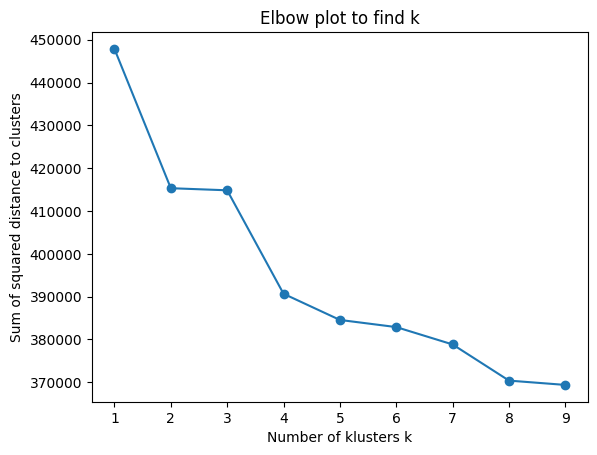

In [323]:
import matplotlib.pyplot as plt
clusters = range(1,10)
sum_squared_distance = [KMeans(n).fit(ratings_rrr).inertia_ for n in clusters ]
fig, ax = plt.figure(), plt.axes()
ax.plot(clusters, sum_squared_distance, "-o")
ax.set(title="Elbow plot to find k", xlabel="Number of klusters k", ylabel="Sum of squared distance to clusters");

In [364]:
ratings_rr.head()

,userId,movieId,rating
0,305,1,5.0
1,305,6,3.5
2,305,16,4.5
3,305,29,5.0
4,305,32,5.0


In [ ]:
# Cosine For Tags Part A) 

# type_of_tag_per_movie.head()
# tf_idf.head()

#tags_r.head()
# (!!!) You need to drop the weights or weight
# genres_rr = genres_r.drop(columns="weights")
genres_rr = genres_r.copy()
genres_rr
tags_rr = tags_r.copy()
tags_rr.head()
print(genres_rr.shape)
print(tags_rr.shape)
print(tags_rr.shape+genres_rr.shape)
tags_genres_combined = pd.concat([tags_rr, genres_rr.rename(columns={"genres":"tag"})])
print((tags_rr.shape[0]+genres_rr.shape[0])-tags_genres_combined.shape[0] )
#tags_genres_combined.set_index("movieId", inplace=True)
#tags_genres_pivot = tags_genres_combined.pivot(["tag"])
tags_genres_combined.reset_index(drop=True, inplace=True)


# tags_genres_pivot.head()
# tags_genres_combined.head()
# print((tags_rr.shape[0]+genres_rr.shape[0])-tags_genres_combined.shape[0] )
tags_genres_combined.drop_duplicates(inplace=True)
print( tags_genres_combined.shape[0] )
tags_genres_combined["ones"]=1
tags_genres_pivot = tags_genres_combined.pivot(index="movieId", columns="tag", values="ones")
tags_genres_pivot.fillna(0, inplace=True)
# pd.set_option('display.max_rows', None)
# tags_genres_pivot.sum().sort_values()
# pd.reset_option('display.max_rows')
tags_genres_pivot

(3393, 2)
(191245, 2)
(191245, 2, 3393, 2)
0
13349


tag,(no genres listed),action,adventure,aliens,alternate reality,animation,anime,artificial intelligence,atmospheric,based on a book,...,true story,twist ending,violence,violent,visually appealing,visually stunning,war,western,witty,world war ii
movieId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
32,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
# Cosine for tags Part B
from sklearn.metrics.pairwise import cosine_similarity
cosine_sim_matrix = cosine_similarity(tags_genres_pivot)
cosine_sim_matrix.shape
# This is the version that only have the movie id 
cosine_sim_id = pd.DataFrame(cosine_sim_matrix, index=tags_genres_pivot.index, columns=tags_genres_pivot.index )
cosine_sim_id

movieId,1,6,16,17,28,29,32,36,41,47,...,263007,270698,274053,275503,277028,278446,278578,281096,285593,286897
movieId,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.270369,0.222566,0.207514,0.000000,0.270369,0.255609,0.000000,0.102598,0.157895,...,0.229416,0.176604,0.152944,0.132453,0.000000,0.162221,0.132453,0.463586,0.331133,0.254514
6,0.270369,1.000000,0.457330,0.142134,0.105409,0.111111,0.306382,0.178174,0.316228,0.378517,...,0.078567,0.272166,0.392837,0.000000,0.117851,0.083333,0.136083,0.068041,0.204124,0.196116
16,0.222566,0.457330,1.000000,0.146254,0.325396,0.114332,0.270226,0.366679,0.325396,0.278207,...,0.000000,0.093352,0.161690,0.280056,0.121268,0.171499,0.210042,0.000000,0.140028,0.067267
17,0.207514,0.142134,0.146254,1.000000,0.539360,0.213201,0.167968,0.227921,0.134840,0.138343,...,0.000000,0.232104,0.201008,0.348155,0.150756,0.213201,0.174078,0.000000,0.174078,0.083624
28,0.000000,0.105409,0.325396,0.539360,1.000000,0.105409,0.083045,0.338062,0.200000,0.000000,...,0.000000,0.086066,0.298142,0.516398,0.223607,0.316228,0.258199,0.000000,0.000000,0.000000
29,0.270369,0.111111,0.114332,0.213201,0.105409,1.000000,0.306382,0.089087,0.105409,0.216295,...,0.314270,0.408248,0.157135,0.136083,0.117851,0.166667,0.272166,0.340207,0.204124,0.326860
32,0.255609,0.306382,0.270226,0.167968,0.083045,0.306382,1.000000,0.070186,0.166091,0.468616,...,0.123797,0.321634,0.061898,0.000000,0.092848,0.196960,0.107211,0.053606,0.107211,0.103005
36,0.000000,0.178174,0.366679,0.227921,0.338062,0.089087,0.070186,1.000000,0.338062,0.086711,...,0.000000,0.072739,0.251976,0.218218,0.377964,0.133631,0.218218,0.000000,0.000000,0.000000
41,0.102598,0.316228,0.325396,0.134840,0.200000,0.105409,0.166091,0.338062,1.000000,0.307794,...,0.000000,0.086066,0.149071,0.258199,0.223607,0.158114,0.387298,0.129099,0.129099,0.000000


In [ ]:
# Cosine for tags part C
#cosine_sim_dataframe.sort_values(1, ascending=False)

# This is the version that only have the movie name, technically I could mix them 
titles_without_year = titles_r["title"].apply(lambda x: x[:-7] )
titles_without_year
cosine_sim_names = pd.DataFrame(cosine_sim_matrix, index=titles_without_year, columns=titles_without_year )
cosine_sim_names

title,Toy Story,Heat,Casino,Sense and Sensibility,Persuasion,"City of Lost Children, The (Cité des enfants perdus, La)",Twelve Monkeys (a.k.a. 12 Monkeys),Dead Man Walking,Richard III,Seven (a.k.a. Se7en),...,Spider-Man: No Way Home,Everything Everywhere All at Once,Top Gun: Maverick,Aftersun,Thirteen Lives,The Banshees of Inisherin,All Quiet on the Western Front,Puss in Boots: The Last Wish,Guardians of the Galaxy Volume 3,Spider-Man: Across the Spider-Verse
title,,,,,,,,,,,,,,,,,,,,,
Toy Story,1.000000,0.270369,0.222566,0.207514,0.000000,0.270369,0.255609,0.000000,0.102598,0.157895,...,0.229416,0.176604,0.152944,0.132453,0.000000,0.162221,0.132453,0.463586,0.331133,0.254514
Heat,0.270369,1.000000,0.457330,0.142134,0.105409,0.111111,0.306382,0.178174,0.316228,0.378517,...,0.078567,0.272166,0.392837,0.000000,0.117851,0.083333,0.136083,0.068041,0.204124,0.196116
Casino,0.222566,0.457330,1.000000,0.146254,0.325396,0.114332,0.270226,0.366679,0.325396,0.278207,...,0.000000,0.093352,0.161690,0.280056,0.121268,0.171499,0.210042,0.000000,0.140028,0.067267
Sense and Sensibility,0.207514,0.142134,0.146254,1.000000,0.539360,0.213201,0.167968,0.227921,0.134840,0.138343,...,0.000000,0.232104,0.201008,0.348155,0.150756,0.213201,0.174078,0.000000,0.174078,0.083624
Persuasion,0.000000,0.105409,0.325396,0.539360,1.000000,0.105409,0.083045,0.338062,0.200000,0.000000,...,0.000000,0.086066,0.298142,0.516398,0.223607,0.316228,0.258199,0.000000,0.000000,0.000000
"City of Lost Children, The (Cité des enfants perdus, La)",0.270369,0.111111,0.114332,0.213201,0.105409,1.000000,0.306382,0.089087,0.105409,0.216295,...,0.314270,0.408248,0.157135,0.136083,0.117851,0.166667,0.272166,0.340207,0.204124,0.326860
Twelve Monkeys (a.k.a. 12 Monkeys),0.255609,0.306382,0.270226,0.167968,0.083045,0.306382,1.000000,0.070186,0.166091,0.468616,...,0.123797,0.321634,0.061898,0.000000,0.092848,0.196960,0.107211,0.053606,0.107211,0.103005
Dead Man Walking,0.000000,0.178174,0.366679,0.227921,0.338062,0.089087,0.070186,1.000000,0.338062,0.086711,...,0.000000,0.072739,0.251976,0.218218,0.377964,0.133631,0.218218,0.000000,0.000000,0.000000
Richard III,0.102598,0.316228,0.325396,0.134840,0.200000,0.105409,0.166091,0.338062,1.000000,0.307794,...,0.000000,0.086066,0.149071,0.258199,0.223607,0.158114,0.387298,0.129099,0.129099,0.000000


In [ ]:
# Exportying Cosin Matrix 
cosine_sim_names.to_csv("data/movies_cosine_sim.csv")


In [ ]:
input_movie = "Heat"
cosine_sim_names.sort_values(input_movie, ascending=False, inplace=True)
list( cosine_sim_names.index[1:6] ) 

['Terminator, The',
 'Silence of the Lambs, The',
 'Die Hard',
 'Reservoir Dogs',
 'Departed, The']

In [451]:
movie_database = set(cosine_sim_names.index)
"Heat" in movie_database


True

In [453]:
pd.read_csv("data/movies_cosine_sim.csv").set_index("title", drop=True)

,Toy Story,Heat,Casino,Sense and Sensibility,Persuasion,"City of Lost Children, The (Cité des enfants perdus, La)",Twelve Monkeys (a.k.a. 12 Monkeys),Dead Man Walking,Richard III,Seven (a.k.a. Se7en),...,Spider-Man: No Way Home,Everything Everywhere All at Once,Top Gun: Maverick,Aftersun,Thirteen Lives,The Banshees of Inisherin,All Quiet on the Western Front.1,Puss in Boots: The Last Wish,Guardians of the Galaxy Volume 3,Spider-Man: Across the Spider-Verse
title,,,,,,,,,,,,,,,,,,,,,
Toy Story,1.000000,0.270369,0.222566,0.207514,0.000000,0.270369,0.255609,0.000000,0.102598,0.157895,...,0.229416,0.176604,0.152944,0.132453,0.000000,0.162221,0.132453,0.463586,0.331133,0.254514
Heat,0.270369,1.000000,0.457330,0.142134,0.105409,0.111111,0.306382,0.178174,0.316228,0.378517,...,0.078567,0.272166,0.392837,0.000000,0.117851,0.083333,0.136083,0.068041,0.204124,0.196116
Casino,0.222566,0.457330,1.000000,0.146254,0.325396,0.114332,0.270226,0.366679,0.325396,0.278207,...,0.000000,0.093352,0.161690,0.280056,0.121268,0.171499,0.210042,0.000000,0.140028,0.067267
Sense and Sensibility,0.207514,0.142134,0.146254,1.000000,0.539360,0.213201,0.167968,0.227921,0.134840,0.138343,...,0.000000,0.232104,0.201008,0.348155,0.150756,0.213201,0.174078,0.000000,0.174078,0.083624
Persuasion,0.000000,0.105409,0.325396,0.539360,1.000000,0.105409,0.083045,0.338062,0.200000,0.000000,...,0.000000,0.086066,0.298142,0.516398,0.223607,0.316228,0.258199,0.000000,0.000000,0.000000
"City of Lost Children, The (Cité des enfants perdus, La)",0.270369,0.111111,0.114332,0.213201,0.105409,1.000000,0.306382,0.089087,0.105409,0.216295,...,0.314270,0.408248,0.157135,0.136083,0.117851,0.166667,0.272166,0.340207,0.204124,0.326860
Twelve Monkeys (a.k.a. 12 Monkeys),0.255609,0.306382,0.270226,0.167968,0.083045,0.306382,1.000000,0.070186,0.166091,0.468616,...,0.123797,0.321634,0.061898,0.000000,0.092848,0.196960,0.107211,0.053606,0.107211,0.103005
Dead Man Walking,0.000000,0.178174,0.366679,0.227921,0.338062,0.089087,0.070186,1.000000,0.338062,0.086711,...,0.000000,0.072739,0.251976,0.218218,0.377964,0.133631,0.218218,0.000000,0.000000,0.000000
Richard III,0.102598,0.316228,0.325396,0.134840,0.200000,0.105409,0.166091,0.338062,1.000000,0.307794,...,0.000000,0.086066,0.149071,0.258199,0.223607,0.158114,0.387298,0.129099,0.129099,0.000000


In [497]:
import re 
li=[
'sling blade, a (a.k.a throw knife) (1992)',
'terminator, the (le terminator) (1985)',
'terminator, green (le terminator) (1985)',
'sling blade (1992)'
]

pattern = r"(.*?)(, a |, the )?(\(.*\))? (\(\d\d\d\d\))"
groups = [ re.findall(pattern, st) for st in li ]
print( groups )

[[('sling blade', ', a ', '(a.k.a throw knife)', '(1992)')], [('terminator', ', the ', '(le terminator)', '(1985)')], [('terminator, green ', '', '(le terminator)', '(1985)')], [('sling blade', '', '', '(1992)')]]


In [483]:
titles_r

,title
movieId,
1,Toy Story (1995)
6,Heat (1995)
16,Casino (1995)
17,Sense and Sensibility (1995)
28,Persuasion (1995)
29,"City of Lost Children, The (Cité des enfants p..."
32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995)
36,Dead Man Walking (1995)
41,Richard III (1995)


In [ ]:
import re 
titles_r
test  = titles_r.loc[[50, 293, 364, 615, 670, 1251, 1289, 1296, 1291]].copy()
test_2 = titles_r.loc[titles_r.index[0:1300]].copy()
# title prefix alt year

pattern = r"(.*?)(, a |, the )?(\(.*\) )?(\(\d{4}\))"



# Note that there can be more then one alternative title, by I couldn't be bothered
# so there is max one alternative title per movie
# Technically one probelbly should make a title without non english characters like é
titles_exp = pd.DataFrame(index=test_2.index, columns=["prefix", "title", "alt", "title year", "alt year", "title duplicates", "alt duplicates"])
titles_exp["title duplicates"] = False 
titles_exp["alt duplicates"] = False 
for row in test_2.itertuples():
    #titles_exp tit
    regex_groups = re.findall(pattern, row[1].lower())
    
    # (!) the if else statment is needed because there is a bug with one of the movies
    titles_exp.loc[row[0], "title"]=regex_groups[0][0] if regex_groups[0] else str()
    # Cleans up the string contained in the gruop and preforms
    # a little hack to add an empty string if regex don't capture anything
    prefix = re.findall(r"a|the" ,regex_groups[0][1])
    titles_exp.loc[row[0], "prefix"]=prefix[0] if prefix else str()
    
    alt = re.findall(r"\(a.k.a. (.*?)\)|\((.*?)\)" ,regex_groups[0][2])
    if alt == []:
        alt = str() 
    elif alt[0][0] == "":
        alt=alt[0][1]
    else: 
        alt=alt[0][0]

    # (!) Safty Probably not needed 
    year = regex_groups[0][3] if regex_groups[0][3] else str()
    titles_exp.loc[row[0], "alt"]= alt
    titles_exp.loc[row[0], "title year"]=f"{regex_groups[0][0]} {regex_groups[0][3]}"
    titles_exp.loc[row[0], "alt year"]=f"{alt} {regex_groups[0][3]}"
    
    #print( row[0], row[1] ) 
    #break
titles_exp
#duplicates = titles_exp[titles_exp.duplicated(keep=False)].index
#mask = titles_exp.index.isin(duplicates)

#titles_exp


,prefix,title,alt,title year,alt year,title duplicates,alt duplicates
movieId,,,,,,,
1,,toy story,,toy story (1995),(1995),False,False
6,,heat,,heat (1995),(1995),False,False
16,,casino,,casino (1995),(1995),False,False
17,,sense and sensibility,,sense and sensibility (1995),(1995),False,False
28,,persuasion,,persuasion (1995),(1995),False,False
29,the,city of lost children,"cité des enfants perdus, la",city of lost children (1995),"cité des enfants perdus, la (1995)",False,False
32,,twelve monkeys,12 monkeys,twelve monkeys (1995),12 monkeys (1995),False,False
36,,dead man walking,,dead man walking (1995),(1995),False,False
41,,richard iii,,richard iii (1995),(1995),False,False


In [632]:
titles_r

,title
movieId,
1,Toy Story (1995)
6,Heat (1995)
16,Casino (1995)
17,Sense and Sensibility (1995)
28,Persuasion (1995)
29,"City of Lost Children, The (Cité des enfants p..."
32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995)
36,Dead Man Walking (1995)
41,Richard III (1995)


In [621]:
titles_r

,title
movieId,
1,Toy Story (1995)
6,Heat (1995)
16,Casino (1995)
17,Sense and Sensibility (1995)
28,Persuasion (1995)
29,"City of Lost Children, The (Cité des enfants p..."
32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995)
36,Dead Man Walking (1995)
41,Richard III (1995)


In [605]:
len(duplicates)

1577

In [ ]:
# Ignore The and A
# Grab Year  
# If yes 
# Check Title and Alt 
# If No
# Check Dublets
# If Yes 
# question 
# If No 
# Check Title and Alt 
# Execute
input_movie=" A Terminatore (1985) "
input_movie = input_movie.strip().lower()
input_movie = re.findall(r"(^a |^the )?(.* )(\(\d{4}\)$)?" ,input_movie)
input_movie[0][1].strip()

# Check if the user inputed a year, if so 

'terminatore'

In [ ]:


# Takes a string, in this case a movie title, and strips it of 
# ', the' '(1995)' '(Alternate Tiles)'
def stripperclip(st): 


In [480]:
# Create a list of movies with the same title
# (!!!) drop indxe bug so you might have to drop the index if you rerun the whole thing
duplicates = titles_r["title"].apply(lambda x: x[:-7] ).copy()
duplicates = duplicates[duplicates.duplicated(keep=False)]
duplicates = titles_r.loc[duplicates.index]
duplicates
movie="Spellbound"
duplicates[ duplicates["title"]==movie]
titles_r


,title
movieId,
1,Toy Story (1995)
6,Heat (1995)
16,Casino (1995)
17,Sense and Sensibility (1995)
28,Persuasion (1995)
29,"City of Lost Children, The (Cité des enfants p..."
32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995)
36,Dead Man Walking (1995)
41,Richard III (1995)
